In [26]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

In [145]:
def show_images_multi(df, title, n=8, true_class=None, model_pred_cols=None):
    """
    Display a sample of images from the dataset with their true class and optional model predictions.

    Functionality:
    - Randomly sample up to `n` images from the provided DataFrame.
    - Optionally filter images by a specified true class (e.g., 'adenoma').
    - Display images in a horizontal layout with their true labels.
    - (Optional) Support for showing multiple model predictions per image.

    Parameters:
    - df: pandas DataFrame containing at least columns ["path", "target_name"] and optionally prediction columns.
    - title: Title for the entire image grid (displayed above the plot).
    - n: Maximum number of images to display (default: 8).
    - true_class: If specified, only images belonging to this class will be shown.
    - model_pred_cols: (Optional) List of column names containing model predictions to be shown per image.

    Returns:
    - None
    """
    if true_class is not None:
        df = df[df['target_name'] == true_class]
    if len(df) == 0:
        print(" No matching samples found for the given filters.")
        return

    samples = df.sample(n=min(n, len(df)))
    fig, axes = plt.subplots(1, len(samples), figsize=(4 * len(samples), 4))
    if len(samples) == 1:
        axes = [axes]

    for ax, (_, row) in zip(axes, samples.iterrows()):
        try:
            img = Image.open(row["path"]).convert("RGB")
        except:
            print(f" Failed to open image: {row['path']}")
            continue
        ax.imshow(img)

        title_lines = [f"True: {row['target_name']}"]
        # if model_pred_cols is not None:
            # for i, col in enumerate(model_pred_cols):
            #     model_id = col.replace("pred_", "")
            #     pred_val = row.get(col, "?")
            #     pred_name = idx_to_class.get(pred_val, "?")
            #     title_lines.append(f"model {i} prediction {pred_name}")
        ax.set_title("\n".join(title_lines), fontsize=10)
        ax.axis('off')

    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

In [168]:
def print_common_and_partial_errors_with_stats(csv_folder, test_txt_path, num_partial=5):
    """
    Print:
    - All image paths misclassified by all models (intersection)
    - A few image paths misclassified by individual models but not all (partial)
    - Class-wise counts of misclassified samples per model
    - Class-wise counts for the common misclassified samples across all models

    Parameters:
    - csv_folder: folder containing CSV files of misclassified samples
    - test_txt_path: path to the test.txt file mapping image paths to ground-truth labels
    - num_partial: number of partial (non-common) errors to print per model

    Return:

    - common_errors: set of common error file paths
    - common_errors_adenoma: subset with label 0
    - common_errors_hyper: subset with label 1
    """

    # Load full test set to get ground-truth labels for each image path
    with open(test_txt_path, "r") as f:
        test_lines = [line.strip().split("\t") for line in f if line.strip()]
        test_df = pd.DataFrame(test_lines, columns=["path", "label"])
        test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
        test_df = test_df.set_index("path")
        path_to_label = test_df["label"].to_dict()
        idx_to_class = {0: "adenoma", 1: "hyperplastic polyp"}

    # Load all model misclassified sets
    csv_files = glob.glob(os.path.join(csv_folder, "*.csv"))
    all_sets = {}
    model_class_counts = {}

    for csv_path in csv_files:
        model_name = os.path.splitext(os.path.basename(csv_path))[0]
        df = pd.read_csv(csv_path)
        paths = set(df["path"])
        all_sets[model_name] = paths

        # Count number of misclassified samples per class
        labels = [path_to_label.get(p, -1) for p in paths]
        label_counts = pd.Series(labels).value_counts().sort_index()
        model_class_counts[model_name] = label_counts

    # Find common misclassified paths across all models
    common_errors = set.intersection(*all_sets.values())
    print(f"\nCommon misclassified samples across all {len(csv_files)} models ({len(common_errors)} total):")
    # for path in sorted(common_errors):
    #     print(" -", path)
    
    # Count class distribution for the common errors
    #common_labels = [path_to_label.get(p, -1) for p in common_errors]
    common_labels = {p: path_to_label.get(p, -1) for p in common_errors}
    common_errors_adenoma = {p for p, label in common_labels.items() if label == 0}
    common_errors_hyper = {p for p, label in common_labels.items() if label == 1}
    common_counts = pd.Series(common_labels).value_counts().sort_index()
    print("\nClass distribution of common misclassified samples:")
    for class_id, count in common_counts.items():
        class_name = idx_to_class.get(class_id, "Unknown")
        print(f"  - {class_name}: {count}")

    # Print per-model partial misclassified samples (not in common set)
    print(f"\nSamples misclassified in individual models but NOT by all:")
    for model, error_set in all_sets.items():
        partial_errors = list(error_set - common_errors)
        print(f"\n{model} — {len(partial_errors)} partial errors (showing up to {num_partial}):")
        # for path in partial_errors[:num_partial]:
        #     print("  -", path)

    # Print class breakdown for each model's total misclassified set
    print(f"\nPer-model misclassified sample counts by class:")
    for model, label_counts in model_class_counts.items():
        print(f"\n{model}:")
        for class_id in [0, 1]:
            count = label_counts.get(class_id, 0)
            class_name = idx_to_class[class_id]
            print(f"  - {class_name}: {count}")
    return common_errors, common_errors_adenoma, common_errors_hyper

### Pretrain + dataAug test set

In [134]:
CSV_FOLDER = "./error/pretrain_dataAug/test"   
TEST_TXT_PATH = "./splits/test.txt"     
N_SHOW = 8                              

Common misclassified samples across 5 models: 44


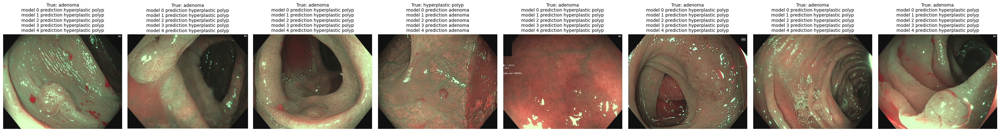

In [135]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)
csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")
model_pred_cols = [f"pred_{os.path.splitext(os.path.basename(p))[0]}" for p in csv_files]
show_images_multi(common_df, "", n=N_SHOW, model_pred_cols=model_pred_cols)

In [136]:
print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 5 models (44 total):

Class distribution of common misclassified samples:
  - adenoma: 30
  - hyperplastic polyp: 14

Samples misclassified in individual models but NOT by all:

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-2_test — 33 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-1_test — 21 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-3_test — 29 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-4_test — 26 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-0_test — 24 partial errors (showing up to 5):

Per-model misclassified sample counts by class:

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-2_test:
  - adenoma: 56
  - hyperplastic polyp: 21

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-1_test:
  - adenoma: 49
  - hyperplastic polyp: 16

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-3

### Pretrain intersects dataAug test set

In [38]:
CSV_FOLDER = "./error/all/test"   
TEST_TXT_PATH = "./splits/test.txt"     
N_SHOW = 8                    

Common misclassified samples across 10 models: 26


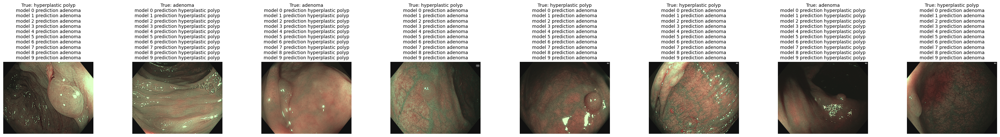

In [39]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)
csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")
model_pred_cols = [f"pred_{os.path.splitext(os.path.basename(p))[0]}" for p in csv_files]
show_images_multi(common_df, "", n=N_SHOW, model_pred_cols=model_pred_cols)

In [40]:
print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 10 models (26 total):
 - /users/Etu0/21400500/Polar_Dataset/validation_set/02440e37676e428d93bfde76b3886fe3/3359cff4-3602-4006-a7de-5bd9bd91944b.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/2493ab33ef3143bfb0ed920c25a27c44/1e10dee3-7e0a-4937-a04a-894d3a474127.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/287a18ae061a4f779a02d787f01e823c/bc673cdc-2e3a-41c7-8b37-cf289a3e42d5.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/3ab71a8d481d4447aa03f8183bc6bd76/f0b7ae9d-905d-448d-bc49-90bc457bdfbb.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/401441007aed45a795ee1cb78adad33b/a800dec1-4a04-4f86-9063-078371355931.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/45ab302bf0b24e2bb1e1591cc21ca917/a4ff37ab-3e5c-47ed-bc1e-cda12016f000.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/56bb099ee9194520b3e56ff39f713301/66ec70de-dd86-4dd5-ac8c-543722265901.png
 - /users/Etu0/21400500/Polar_Dataset/validation

### Pretrain val set

In [46]:
CSV_FOLDER = "./error/pretrain/val"   
TEST_TXT_PATH = "./splits/val.txt"     
N_SHOW = 8 

Common misclassified samples across 5 models: 32


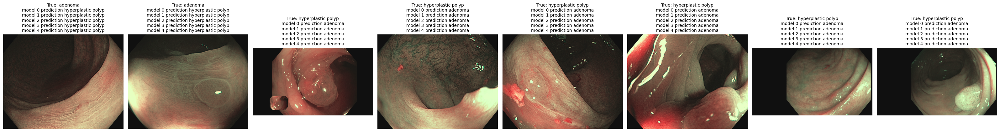

In [47]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)
csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")
model_pred_cols = [f"pred_{os.path.splitext(os.path.basename(p))[0]}" for p in csv_files]
show_images_multi(common_df, "", n=N_SHOW, model_pred_cols=model_pred_cols)

In [48]:
print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 5 models (32 total):
 - /users/Etu0/21400500/Polar_Dataset/train_set/036cccdf95b906d7be5d84109c36a164/74f98ef116d8c809606a859f1a6d8010/d460a4d7-a9c8-4e08-9ce9-ddf2ba6da67f.full.png
 - /users/Etu0/21400500/Polar_Dataset/train_set/0ca005d2074a3e83b7e6021c92a1ea48/44c9ac60eebea57647731b44fcd96e4b/27058f1b-e39a-4efa-a4b8-53180d324e13.full.png
 - /users/Etu0/21400500/Polar_Dataset/train_set/176090c0af860b04d4d424af624d92e8/3ab10caeaaf1dbdf6520fb89ed3a22ca/93663b8b-2e10-43c4-94ec-ce75c15c1242.full.png
 - /users/Etu0/21400500/Polar_Dataset/train_set/1bdc058afa3a2946f66a1be9cf474f2f/d4877f8b09ae31d7e82130c6a19a05d2/f790c867-2ad3-4b2e-b67a-08bd4962f382.full.png
 - /users/Etu0/21400500/Polar_Dataset/train_set/1f83a8763cded0fdfee5029fe096e73c/34b5ea3943f0ca2a834e362d6d688899/47e3e15b-c742-4234-88e3-d99bfc8f94f1.full.png
 - /users/Etu0/21400500/Polar_Dataset/train_set/3ae09e7c9d3ead102db731933d008d09/91fcf7a32535339bd9f6684433adfc39/9a663764-b9be-495e-90da-

### Pretrain + DataAug val set

In [52]:
CSV_FOLDER = "./error/pretrain_dataAug/val"   
TEST_TXT_PATH = "./splits/val.txt"     
N_SHOW = 8 

Common misclassified samples across 5 models: 3


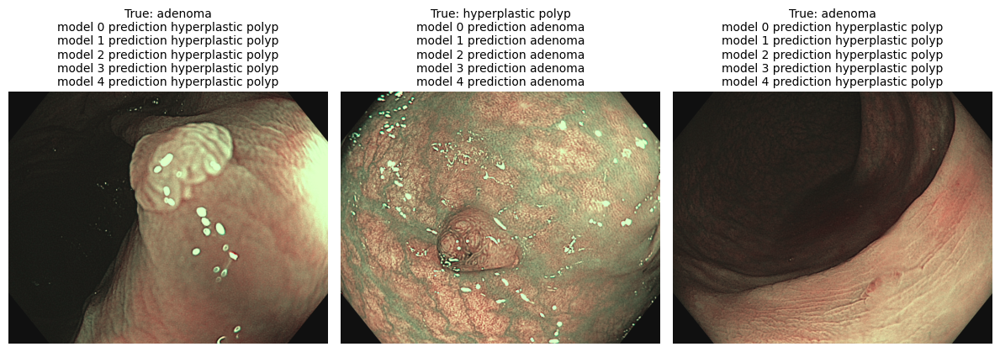

In [53]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)
csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")
model_pred_cols = [f"pred_{os.path.splitext(os.path.basename(p))[0]}" for p in csv_files]
show_images_multi(common_df, "", n=N_SHOW, model_pred_cols=model_pred_cols)

In [54]:
print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 5 models (3 total):
 - /users/Etu0/21400500/Polar_Dataset/train_set/036cccdf95b906d7be5d84109c36a164/74f98ef116d8c809606a859f1a6d8010/d460a4d7-a9c8-4e08-9ce9-ddf2ba6da67f.full.png
 - /users/Etu0/21400500/Polar_Dataset/train_set/1a1a2453bfad27f19bb7662c55162fe0/5ccac1040105aff08386779f5a7304a3/e3a1a24b-9bed-4ff8-8c50-767e73737b3a.full.png
 - /users/Etu0/21400500/Polar_Dataset/train_set/cae78fb42caed837f2a0f2081cfd02a3/e3dfa10ba6c3832838127c705935fa4d/159ee734-ce97-4a93-be40-74de054f5e87.full.png

Class distribution of common misclassified samples:
  - adenoma: 2
  - hyperplastic polyp: 1

Samples misclassified in individual models but NOT by all:

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-0_val — 10 partial errors (showing up to 5):
  - /users/Etu0/21400500/Polar_Dataset/train_set/95a1adcaf8a98dec653e1413828bae40/f83e00577a7ad8ef6b9df4b000ff606c/4c48fbea-4cd4-4354-99e9-dd2882f3484f.full.png
  - /users/Etu0/21400500/Polar_Dataset/train_set/

### Pretrain intersects DataAug val set

In [55]:
CSV_FOLDER = "./error/all/val"   
TEST_TXT_PATH = "./splits/val.txt"     
N_SHOW = 8 

Common misclassified samples across 10 models: 2


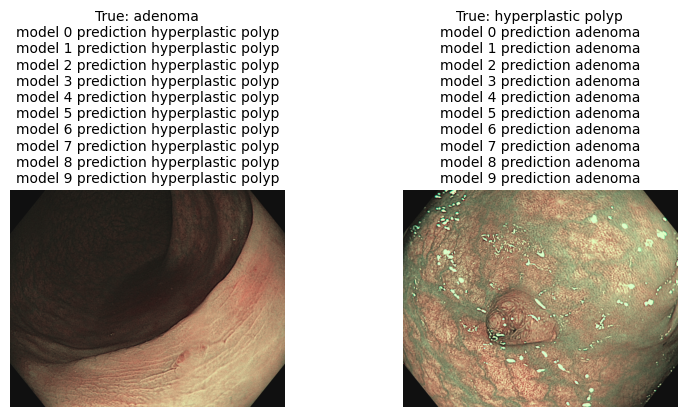

In [56]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)
csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")
model_pred_cols = [f"pred_{os.path.splitext(os.path.basename(p))[0]}" for p in csv_files]
show_images_multi(common_df, "", n=N_SHOW, model_pred_cols=model_pred_cols)

In [57]:
print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 10 models (2 total):
 - /users/Etu0/21400500/Polar_Dataset/train_set/036cccdf95b906d7be5d84109c36a164/74f98ef116d8c809606a859f1a6d8010/d460a4d7-a9c8-4e08-9ce9-ddf2ba6da67f.full.png
 - /users/Etu0/21400500/Polar_Dataset/train_set/cae78fb42caed837f2a0f2081cfd02a3/e3dfa10ba6c3832838127c705935fa4d/159ee734-ce97-4a93-be40-74de054f5e87.full.png

Class distribution of common misclassified samples:
  - adenoma: 1
  - hyperplastic polyp: 1

Samples misclassified in individual models but NOT by all:

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-0_val — 11 partial errors (showing up to 5):
  - /users/Etu0/21400500/Polar_Dataset/train_set/95a1adcaf8a98dec653e1413828bae40/f83e00577a7ad8ef6b9df4b000ff606c/4c48fbea-4cd4-4354-99e9-dd2882f3484f.full.png
  - /users/Etu0/21400500/Polar_Dataset/train_set/cc4bf5f7c61537dca8a8e77cff283bc8/e52ce2f0ad46c828392172490af20da4/005be1c4-4e0e-466b-ab1f-e2303d2adafa.full.png
  - /users/Etu0/21400500/Polar_Dataset/train_se

### Unablanced Dataset test set

In [64]:
CSV_FOLDER = "./error/2stage"   
TEST_TXT_PATH = "./splits/test.txt"     
N_SHOW = 8 

Common misclassified samples across 3 models: 44


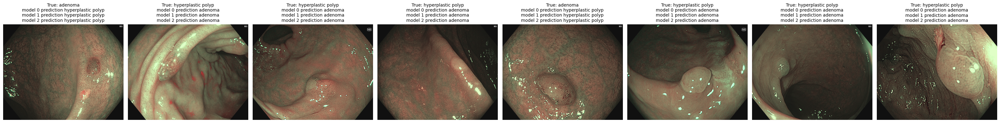

In [65]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)
csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")
model_pred_cols = [f"pred_{os.path.splitext(os.path.basename(p))[0]}" for p in csv_files]
show_images_multi(common_df, "", n=N_SHOW, model_pred_cols=model_pred_cols)

In [66]:
print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 3 models (44 total):
 - /users/Etu0/21400500/Polar_Dataset/validation_set/2493ab33ef3143bfb0ed920c25a27c44/1e10dee3-7e0a-4937-a04a-894d3a474127.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/2eca5a4e02234219b75fa286e1bfffbf/4ae250aa-f9ef-46fc-81dc-b5654ee1ca9d.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/2eca5a4e02234219b75fa286e1bfffbf/c0f51daa-35a3-4f1c-89c6-6c64d33de461.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/320cfe35960a4f22bf63409eb41e8b09/3f70bec9-3328-4fa2-a3d0-b6899429b623.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/32fbb41986564bdfa200ee86bfef4bd5/92f40e06-1d6e-41e0-bd27-ae713454e4e8.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/32fbb41986564bdfa200ee86bfef4bd5/f02cc55a-4fc9-42fd-b617-17dd8726da5a.png
 - /users/Etu0/21400500/Polar_Dataset/validation_set/3877caed332c4c3f90673d5d146fb37d/6cda17f4-c179-450f-b76e-2ad736c7b573.png
 - /users/Etu0/21400500/Polar_Dataset/validation_

### DataAug test set

In [165]:
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image


CSV_FOLDER = "./error/dataAug/test"   
TEST_TXT_PATH = "./splits/test.txt"     
N_SHOW = 8                              
idx_to_class = {0: "adenoma", 1: "hyperplastic polyp"}

In [166]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)

csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")

Common misclassified samples across 5 models: 34


In [169]:
set_dataAug_all, set_dataAug_adenoma, set_dataAug_hyper = print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 5 models (34 total):

Class distribution of common misclassified samples:
  - adenoma: 14
  - hyperplastic polyp: 20

Samples misclassified in individual models but NOT by all:

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-4_test — 53 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-2_test — 43 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-3_test — 55 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-0_test — 56 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-1_test — 46 partial errors (showing up to 5):

Per-model misclassified sample counts by class:

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-4_test:
  - adenoma: 62
  - hyperplastic polyp: 25

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-2_test:
  - adenoma: 51
  - hyperplastic polyp: 26

2024.05.11-VGG1

### Pretrain + DataAug test set

In [170]:
CSV_FOLDER = "./error/pretrain_dataAug/test"   
TEST_TXT_PATH = "./splits/test.txt"     
N_SHOW = 8                              
idx_to_class = {0: "adenoma", 1: "hyperplastic polyp"}

In [171]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)

csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")

Common misclassified samples across 5 models: 44


In [172]:
set_pretrain_dataAug_all, set_pretrain_dataAug_adenoma, set_pretrain_dataAug_hyper= print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 5 models (44 total):

Class distribution of common misclassified samples:
  - adenoma: 30
  - hyperplastic polyp: 14

Samples misclassified in individual models but NOT by all:

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-2_test — 33 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-1_test — 21 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-3_test — 29 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-4_test — 26 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-0_test — 24 partial errors (showing up to 5):

Per-model misclassified sample counts by class:

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-2_test:
  - adenoma: 56
  - hyperplastic polyp: 21

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-1_test:
  - adenoma: 49
  - hyperplastic polyp: 16

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-3

### Pretrain test set

In [173]:
CSV_FOLDER = "./error/pretrain/test"   
TEST_TXT_PATH = "./splits/test.txt"     
N_SHOW = 8                              
idx_to_class = {0: "adenoma", 1: "hyperplastic polyp"}

In [174]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)

csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")

Common misclassified samples across 5 models: 34


In [175]:
set_pretrain_all, set_pretrain_adenoma, set_pretrain_hyper = print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 5 models (34 total):

Class distribution of common misclassified samples:
  - adenoma: 15
  - hyperplastic polyp: 19

Samples misclassified in individual models but NOT by all:

2024.05.09-VGG19-torch-Pretrain-seed-1_test — 25 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain-seed-2_test — 38 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain-seed-3_test — 21 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain-seed-4_test — 30 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain-seed-0_test — 26 partial errors (showing up to 5):

Per-model misclassified sample counts by class:

2024.05.09-VGG19-torch-Pretrain-seed-1_test:
  - adenoma: 35
  - hyperplastic polyp: 24

2024.05.09-VGG19-torch-Pretrain-seed-2_test:
  - adenoma: 47
  - hyperplastic polyp: 25

2024.05.09-VGG19-torch-Pretrain-seed-3_test:
  - adenoma: 31
  - hyperplastic polyp: 24

2024.05.09-VGG19-torch-Pretrain-seed-4_test:


### Adenoma + Hyperplastic path intersection ratio: Aug/Pretrain + Aug

In [176]:
union_pretrain_aug_all = set_pretrain_all | set_dataAug_all
intersection_with_union_all = set_pretrain_dataAug_all & union_pretrain_aug_all
overlap_ratio = len(intersection_with_union_all) / len(set_pretrain_dataAug_all)

print(f"Overlap count: {len(intersection_with_union_all)}")
print(f"Total in Pretrain+Aug: {len(set_pretrain_dataAug_all)}")
print(f"Overlap ratio: {overlap_ratio:.2%}")


Overlap count: 31
Total in Pretrain+Aug: 44
Overlap ratio: 70.45%


### Adenoma path intersection ratio: Aug or Pretrain/Pretrain + Aug

In [183]:
union_pretrain_aug_adenoma = set_pretrain_adenoma | set_dataAug_adenoma
intersection_with_union_adenoma = set_pretrain_dataAug_adenoma & union_pretrain_aug_adenoma
overlap_ratio = len(intersection_with_union_adenoma) / len(set_pretrain_dataAug_adenoma)

print(f"Overlap count: {len(intersection_with_union_adenoma)}")
print(f"Total in Pretrain+Aug: {len(set_pretrain_dataAug_adenoma)}")
print(f"Overlap ratio: {overlap_ratio:.2%}")


Overlap count: 17
Total in Pretrain+Aug: 30
Overlap ratio: 56.67%


### Adenoma path intersection ratio: pretrain/Pretrain + Aug

In [184]:
union_pretrain_aug_adenoma = set_pretrain_adenoma 
intersection_with_union_adenoma = set_pretrain_dataAug_adenoma & union_pretrain_aug_adenoma
overlap_ratio = len(intersection_with_union_adenoma) / len(set_pretrain_dataAug_adenoma)

print(f"Overlap count: {len(intersection_with_union_adenoma)}")
print(f"Total in Pretrain+Aug: {len(set_pretrain_dataAug_adenoma)}")
print(f"Overlap ratio: {overlap_ratio:.2%}")


Overlap count: 13
Total in Pretrain+Aug: 30
Overlap ratio: 43.33%


### Adenoma path intersection ratio: Aug/Pretrain + Aug

In [185]:
union_pretrain_aug_adenoma = set_dataAug_adenoma 
intersection_with_union_adenoma = set_pretrain_dataAug_adenoma & union_pretrain_aug_adenoma
overlap_ratio = len(intersection_with_union_adenoma) / len(set_pretrain_dataAug_adenoma)

print(f"Overlap count: {len(intersection_with_union_adenoma)}")
print(f"Total in Pretrain+Aug: {len(set_pretrain_dataAug_adenoma)}")
print(f"Overlap ratio: {overlap_ratio:.2%}")


Overlap count: 4
Total in Pretrain+Aug: 30
Overlap ratio: 13.33%


### Aug, Pretrain, Aug + Pretrain intersection

In [137]:
CSV_FOLDER = "./error/all/test"   
TEST_TXT_PATH = "./splits/test.txt"     
N_SHOW = 8                              
idx_to_class = {0: "adenoma", 1: "hyperplastic polyp"}

In [142]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)

csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")

Common misclassified samples across 15 models: 7


In [143]:
print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 15 models (7 total):

Class distribution of common misclassified samples:
  - hyperplastic polyp: 7

Samples misclassified in individual models but NOT by all:

2024.05.09-VGG19-torch-Pretrain-seed-1_test — 52 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain-seed-2_test — 65 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-2_test — 70 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-4_test — 80 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain_and_dataAug-seed-1_test — 58 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain-seed-3_test — 48 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-2_test — 70 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain-seed-4_test — 57 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-3_test — 82 pa

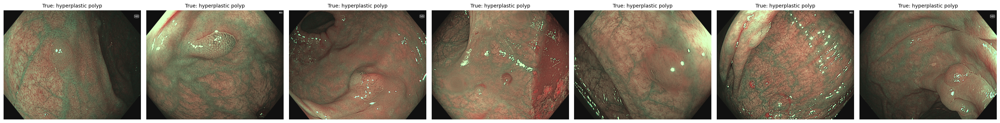

In [146]:
show_images_multi(common_df, "", n=7, model_pred_cols=model_pred_cols)

### Pretrain intersects Aug Test Set

In [121]:
CSV_FOLDER = "./error/all/test/2_distinc"   
TEST_TXT_PATH = "./splits/test.txt"     
N_SHOW = 8                              
idx_to_class = {0: "adenoma", 1: "hyperplastic polyp"}

In [122]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)

csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")

Common misclassified samples across 10 models: 11


In [123]:
print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 10 models (11 total):

Class distribution of common misclassified samples:
  - hyperplastic polyp: 11

Samples misclassified in individual models but NOT by all:

2024.05.09-VGG19-torch-Pretrain-seed-1_test — 48 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain-seed-2_test — 61 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-4_test — 76 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain-seed-3_test — 44 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-2_test — 66 partial errors (showing up to 5):

2024.05.09-VGG19-torch-Pretrain-seed-4_test — 53 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-3_test — 78 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-0_test — 79 partial errors (showing up to 5):

2024.05.11-VGG19-torch-Scratch-Batch-128-DataAug-seed-1_

### Scratch Test Set

In [147]:
CSV_FOLDER = "./error/scratch/test/"   
TEST_TXT_PATH = "./splits/test.txt"     
N_SHOW = 8                              
idx_to_class = {0: "adenoma", 1: "hyperplastic polyp"}

In [148]:
with open(TEST_TXT_PATH, "r") as f:
    test_lines = [line.strip().split("\t") for line in f if line.strip()]
    test_df = pd.DataFrame(test_lines, columns=["path", "label"])
    test_df["label"] = test_df["label"].map({"adenoma": 0, "hyperplastic polyp": 1})
    test_df["path"] = test_df["path"].apply(os.path.expanduser)
    test_df["target_name"] = test_df["label"].map(idx_to_class)

csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
all_misclassified_sets = []
model_preds = {}

for csv_path in csv_files:
    model_name = os.path.splitext(os.path.basename(csv_path))[0]  # e.g., modelA
    df = pd.read_csv(csv_path)
    df["pred_col_name"] = f"pred_{model_name}"
    model_preds[model_name] = df[["path", "pred"]].rename(columns={"pred": f"pred_{model_name}"})
    all_misclassified_sets.append(set(df["path"]))
common_errors = set.intersection(*all_misclassified_sets)
print(f"Common misclassified samples across {len(csv_files)} models: {len(common_errors)}")
common_df = test_df[test_df["path"].isin(common_errors)].copy()
common_df = common_df.rename(columns={"label": "target"})
common_df["target_name"] = common_df["target"].map(idx_to_class)

for model_name, pred_df in model_preds.items():
    common_df = common_df.merge(pred_df, on="path", how="left")

Common misclassified samples across 5 models: 37


In [149]:
print_common_and_partial_errors_with_stats(CSV_FOLDER, TEST_TXT_PATH, num_partial=5)


Common misclassified samples across all 5 models (37 total):

Class distribution of common misclassified samples:
  - adenoma: 10
  - hyperplastic polyp: 27

Samples misclassified in individual models but NOT by all:

2024.05.10-VGG19-torch-Scratch-Batch-128-seed-1_test — 43 partial errors (showing up to 5):

2024.05.10-VGG19-torch-Scratch-Batch-128-seed-0_test — 26 partial errors (showing up to 5):

2024.05.10-VGG19-torch-Scratch-Batch-128-seed-4_test — 35 partial errors (showing up to 5):

2024.05.10-VGG19-torch-Scratch-Batch-128-seed-3_test — 22 partial errors (showing up to 5):

2024.05.10-VGG19-torch-Scratch-Batch-128-seed-2_test — 33 partial errors (showing up to 5):

Per-model misclassified sample counts by class:

2024.05.10-VGG19-torch-Scratch-Batch-128-seed-1_test:
  - adenoma: 48
  - hyperplastic polyp: 32

2024.05.10-VGG19-torch-Scratch-Batch-128-seed-0_test:
  - adenoma: 30
  - hyperplastic polyp: 33

2024.05.10-VGG19-torch-Scratch-Batch-128-seed-4_test:
  - adenoma: 39
 